In [1]:
import os
import numpy as np
import pandas as pd

In [2]:
import torch
import torchvision
from glob import glob
import torch.nn as nn
import matplotlib.pyplot as plt
import torch.nn.functional as F
import torchvision.transforms as transform
from torch.utils.data import DataLoader,Dataset
from torchvision.utils import make_grid
from tqdm import tqdm

from nets import SimpleSegmentationNet
from data import CityscapesDataset
from labels import labels
from unet import UNet

In [3]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(device)

cuda


In [4]:
# Print the current process ID
print("Current Process ID:", os.getpid())

Current Process ID: 1031949


In [5]:
# file_paths = glob('/cluster/projects/vc/data/ad/open/Cityscapes/gtFine_trainvaltest/gtFine/train/bremen/**/*', recursive=True)
train_seg_path = sorted(glob('/cluster/projects/vc/data/ad/open/Cityscapes/gtFine_trainvaltest/gtFine/train/**/*labelIds.png'))
train_img_path = sorted(glob('/cluster/projects/vc/data/ad/open/Cityscapes/leftImg8bit_trainvaltest/leftImg8bit/train/**/*.png'))

val_seg_path = sorted(glob('/cluster/projects/vc/data/ad/open/Cityscapes/gtFine_trainvaltest/gtFine/val/**/*labelIds.png'))
val_img_path = sorted(glob('/cluster/projects/vc/data/ad/open/Cityscapes/leftImg8bit_trainvaltest/leftImg8bit/val/**/*.png'))

test_seg_path = sorted(glob('/cluster/projects/vc/data/ad/open/Cityscapes/gtFine_trainvaltest/gtFine/test/**/*labelIds.png'))
test_img_path = sorted(glob('/cluster/projects/vc/data/ad/open/Cityscapes/leftImg8bit_trainvaltest/leftImg8bit/test/**/*.png'))

In [6]:
print(len(train_seg_path))
print(len(train_img_path))

print(len(val_seg_path))
print(len(val_img_path))

2975
2975
500
500


## Dataset and dataloader

In [7]:
traindata = CityscapesDataset(train_img_path, train_seg_path)
valdata = CityscapesDataset(val_img_path, val_seg_path, test=True)
testdata = CityscapesDataset(test_img_path, test_seg_path, test=True)

In [8]:
batch_size = 4
train_loader = DataLoader(traindata, batch_size)
val_loader = DataLoader(valdata, batch_size)
test_loader = DataLoader(testdata, batch_size)

## Neural network

In [9]:
from labels import labels

In [25]:
num_classes = len(labels)
# model = SimpleSegmentationNet(num_classes)
# model.to(device)

In [26]:
# More complex neural network
num_classes = len(labels)
model = UNet(3, num_classes)
model.to(device)

UNet(
  (inc): DoubleConv(
    (double_conv): Sequential(
      (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU(inplace=True)
    )
  )
  (down1): Down(
    (maxpool_conv): Sequential(
      (0): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (1): DoubleConv(
        (double_conv): Sequential(
          (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): ReLU(inplace=True)
          (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
 

## Training

In [10]:
def show(img, output, label):
    img, output, label = img.cpu(), output.cpu(), label.cpu()
    fig, ax = plt.subplots(len(img), 3, figsize=(15, 30))
    cols = ['Input Image', 'Actual Output', 'Predicted Output']
    
    for x, col in zip(ax[0], cols):
        x.set_title(col)

    for i in range(len(img)):
        Img = img[i].permute(1, 2, 0)
        Lab = output[i].squeeze()  # Assuming output is a segmentation map
        act = label[i].squeeze()  # Assuming label is a segmentation map
        
        ax[i][0].imshow(Img)
        ax[i][1].imshow(act, cmap='tab20')  # Apply a colormap suitable for labels
        ax[i][2].imshow(Lab, cmap='tab20')  # Apply the same colormap to predictions

    plt.tight_layout()
    plt.show()

In [28]:
lr = 0.01
epochs = 50
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=lr)

In [29]:
train_acc = []
val_acc = []
train_loss = []
val_loss = []
val_accuracy = []

In [30]:
checkpoint_dir = "checkpoints/unet"
os.makedirs(checkpoint_dir, exist_ok=True)

for i in range(epochs):
    
    model.train()
    trainloss = 0
    
    for data in train_loader:
        # Training
        img, label = data[0].to(device), data[1].to(device)
        label = label.squeeze(1).to(dtype=torch.long)
        optimizer.zero_grad()

        output = model(img)
        loss = criterion(output, label)
        loss.backward()

        optimizer.step()
        trainloss += loss.item()

    train_loss.append(trainloss / len(train_loader))    
    
    model.eval()

    with torch.no_grad():
        valloss = 0
        total_correct = 0
        total_pixels = 0
        
        for data in val_loader:
            # Validation
            img, label = data[0].to(device), data[1].to(device)
            label = label.squeeze(1).to(dtype=torch.long)
            output = model(img)
            loss = criterion(output, label)
            valloss += loss.item()

            # Calculate accuracy
            _, predicted = torch.max(output.data, 1)
            total_correct += (predicted == label).sum().item()
            total_pixels += label.nelement()

        # show(img, predicted.unsqueeze(1), label)

    val_loss.append(valloss / len(val_loader))
    val_accuracy.append(total_correct / total_pixels)
    
    print("Epoch: {} , Train Loss: {} , Valid Loss: {} , Valid Acc: {:.2f}%".format(i, train_loss[-1], val_loss[-1], 100 * val_accuracy[-1]))

    if i%20 == 0:
        show(img, predicted.unsqueeze(1), label)
        # Checkpointing
        checkpoint = {
            'epoch': i,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'train_loss': train_loss,
            'val_loss': val_loss,
            'val_accuracy': val_accuracy
        }
        torch.save(checkpoint, os.path.join(checkpoint_dir, f'checkpoint_epoch_{i}.pth'))

OutOfMemoryError: CUDA out of memory. Tried to allocate 2.00 GiB. GPU 0 has a total capacty of 39.44 GiB of which 1.67 GiB is free. Including non-PyTorch memory, this process has 37.77 GiB memory in use. Of the allocated memory 35.30 GiB is allocated by PyTorch, and 930.02 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting max_split_size_mb to avoid fragmentation.  See documentation for Memory Management and PYTORCH_CUDA_ALLOC_CONF

## Load model

In [58]:
num_classes = len(labels)
model = UNet(3, num_classes)
model.to(device)

lr = 0.01
epochs = 50
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=lr)

checkpoint_dir = "checkpoints/unet"
checkpoint_path = os.path.join(checkpoint_dir, 'checkpoint_epoch_15.pth') # Replace X with the epoch number

# Load the checkpoint
checkpoint = torch.load(checkpoint_path)

# Update model and optimizer states
model.load_state_dict(checkpoint['model_state_dict'])
optimizer.load_state_dict(checkpoint['optimizer_state_dict'])

# If you need to resume training from a specific epoch
start_epoch = checkpoint['epoch'] + 1

# If you also need to access the loss and accuracy history
train_loss = checkpoint['train_loss']
val_loss = checkpoint['val_loss']
val_accuracy = checkpoint['val_accuracy']

## Ploting the Training VS Validation Loss Curve

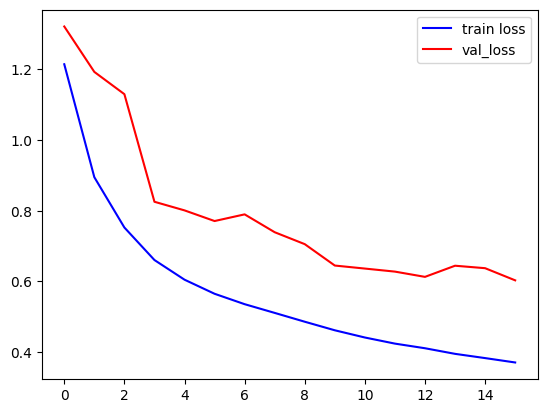

In [59]:
plt.plot(train_loss,color='b',label='train loss')
plt.plot(val_loss,color='r',label = 'val_loss')
plt.legend()

## Testing on testset

In [60]:
import time

# Set the model to evaluation mode
model.eval()

with torch.no_grad():
    correct = 0
    total = 0
    total_time = 0
    total_images_processed = 0  # Initialize total images processed
    
    for data in tqdm(val_loader):
        image, label = data[0].to(device), data[1].to(device)
        label = label.squeeze(1).to(dtype=torch.long)

        batch_size = label.size(0)  # Get batch size
        total_images_processed += batch_size  # Accumulate total images processed

        # Start timer
        start_time = time.time()

        output = model(image)
        
        # End timer
        end_time = time.time()
        total_time += end_time - start_time

        # Get predictions from the maximum value
        _, predicted = torch.max(output.data, 1)
        total += label.nelement()
        correct += (predicted == label).sum().item()

accuracy = 100 * correct / total
print('Accuracy of the model on the test images: {:.2f}%'.format(accuracy))

# Calculate FPS
fps = total_images_processed / total_time
print('Inference speed: {:.2f} FPS'.format(fps))

100%|██████████| 125/125 [03:26<00:00,  1.65s/it]

Accuracy of the model on the test images: 83.11%
Inference speed: 1006.20 FPS


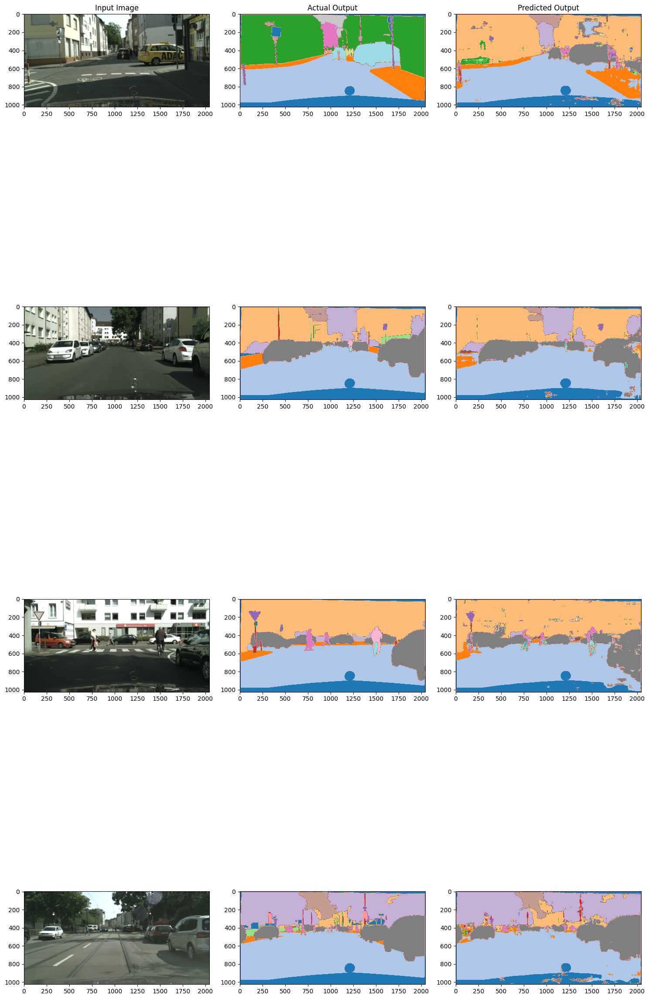

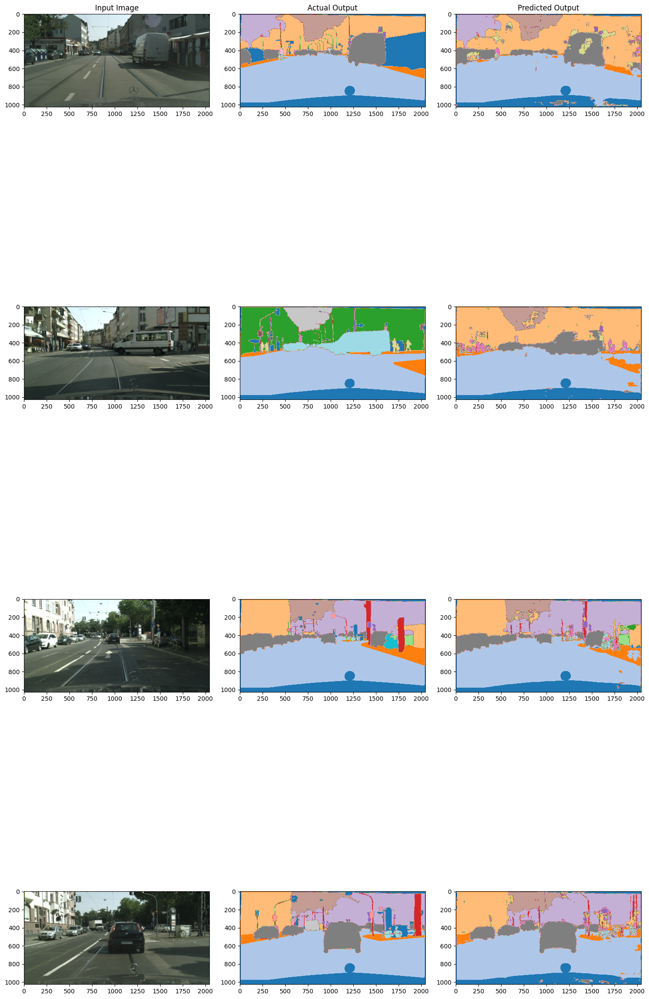

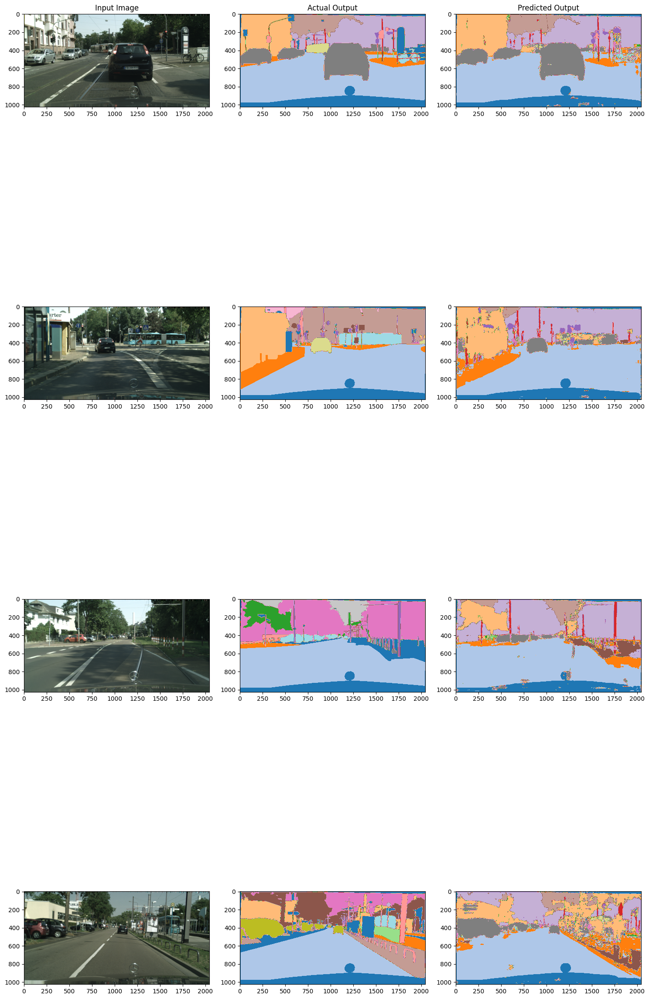

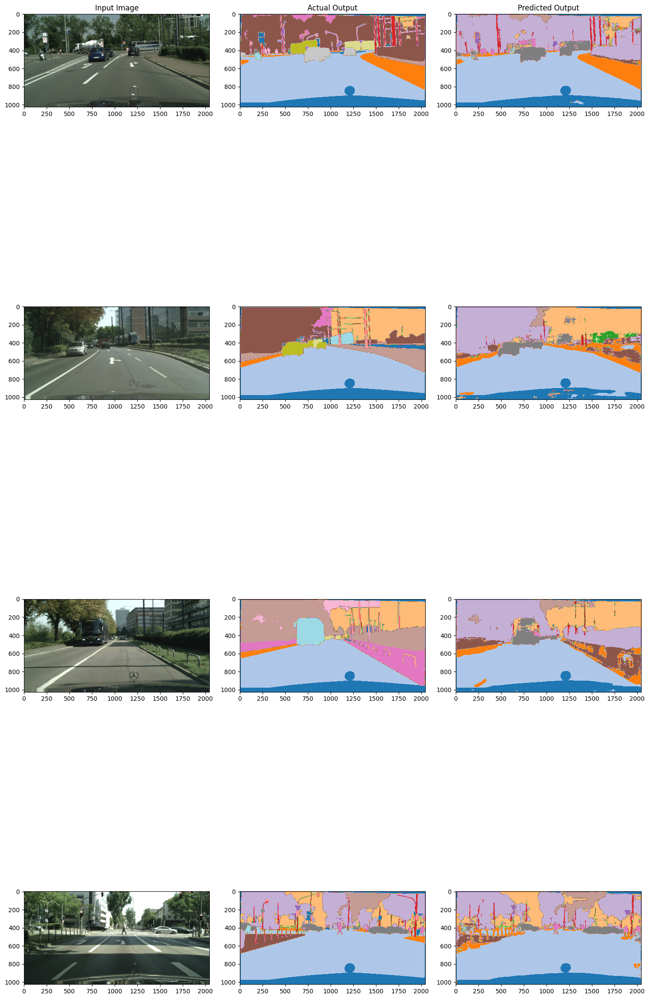

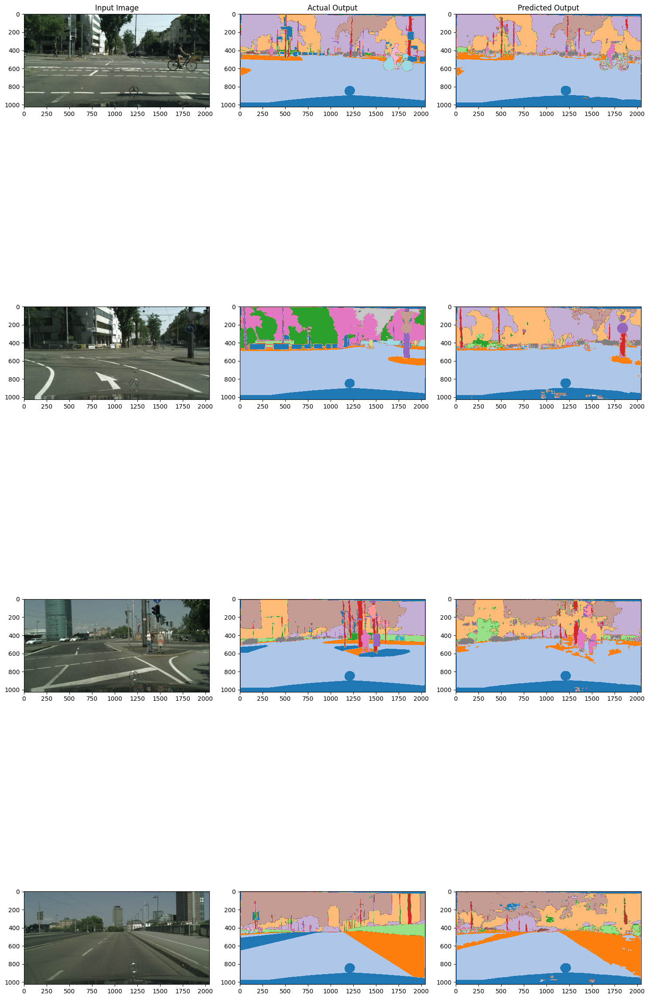

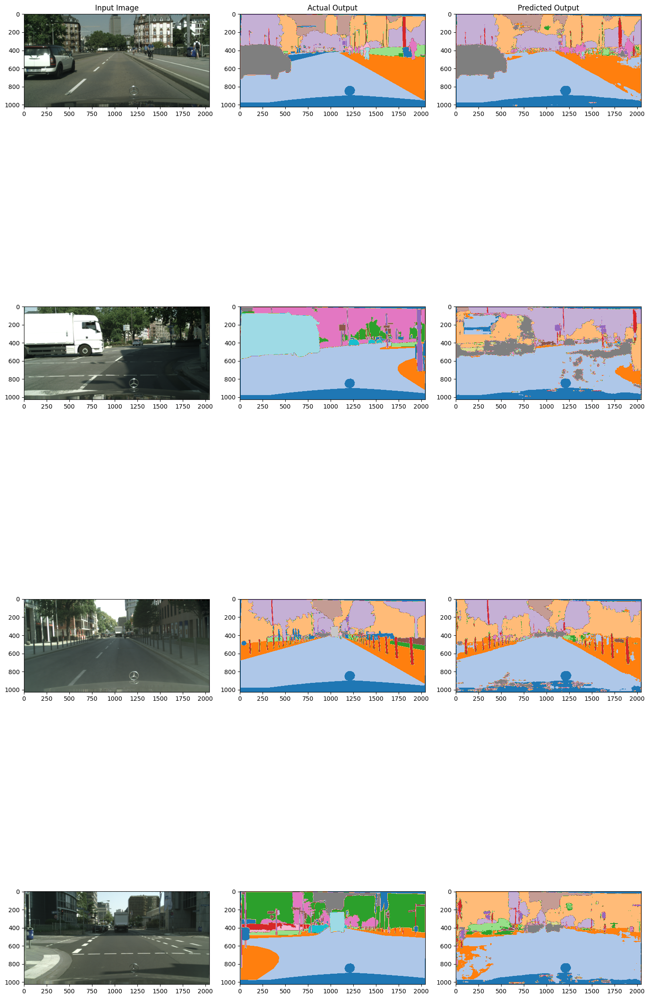

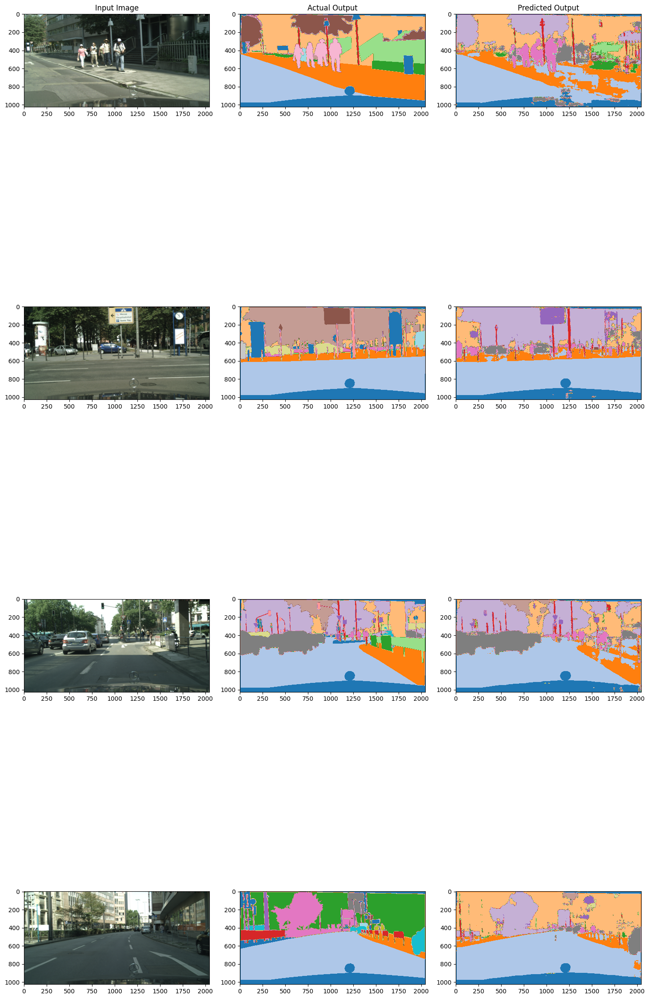

In [68]:
c = 0
with torch.no_grad():
    for img,label in (val_loader):
            img = img.to(device)
            label = label.to(device)
            output = model(img)
            _, predicted = torch.max(output.data, 1)
            show(img, predicted.unsqueeze(1), label)

            if c>5:
                break
            c+=1

In [62]:
import torch
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt

image_paths = glob("/cluster/home/bendikgh/cityscapes_semantic_segmentation/trondheim_images/*")
print(image_paths)

['/cluster/home/bendikgh/cityscapes_semantic_segmentation/trondheim_images/IMG_2756.png', '/cluster/home/bendikgh/cityscapes_semantic_segmentation/trondheim_images/IMG_2759.png', '/cluster/home/bendikgh/cityscapes_semantic_segmentation/trondheim_images/IMG_2763.png', '/cluster/home/bendikgh/cityscapes_semantic_segmentation/trondheim_images/IMG_2762.png']


In [63]:
from torchvision.transforms import functional as F

def center_crop(img, new_width, new_height):
    width, height = img.size   # Get dimensions
    
    # If the image is smaller than the target size, pad it first
    if width < new_width or height < new_height:
        # Calculate padding amounts
        pad_width = max(new_width - width, 0)
        pad_height = max(new_height - height, 0)
        padding = (pad_width // 2, pad_height // 2, pad_width - (pad_width // 2), pad_height - (pad_height // 2))
        img = ImageOps.expand(img, padding)
        width, height = img.size  # Update new dimensions after padding

    left = (width - new_width)/2
    top = (height - new_height)/2
    right = (width + new_width)/2
    bottom = (height + new_height)/2

    # Crop the center of the image
    img = img.crop((left, top, right, bottom))
    return img

# Replace this with the transformations used during your model's training
img_transform = transforms.Compose([
    transforms.ToTensor(),
])


In [64]:

target_width, target_height = 2048, 1024
images = [img_transform(center_crop(Image.open(img_path).convert("RGB"), target_width, target_height)) for img_path in image_paths]

print(len(images))

print(images[0].size())

4
torch.Size([3, 1024, 2048])


torch.Size([4, 3, 1024, 2048])
torch.Size([4, 35, 1024, 2048])


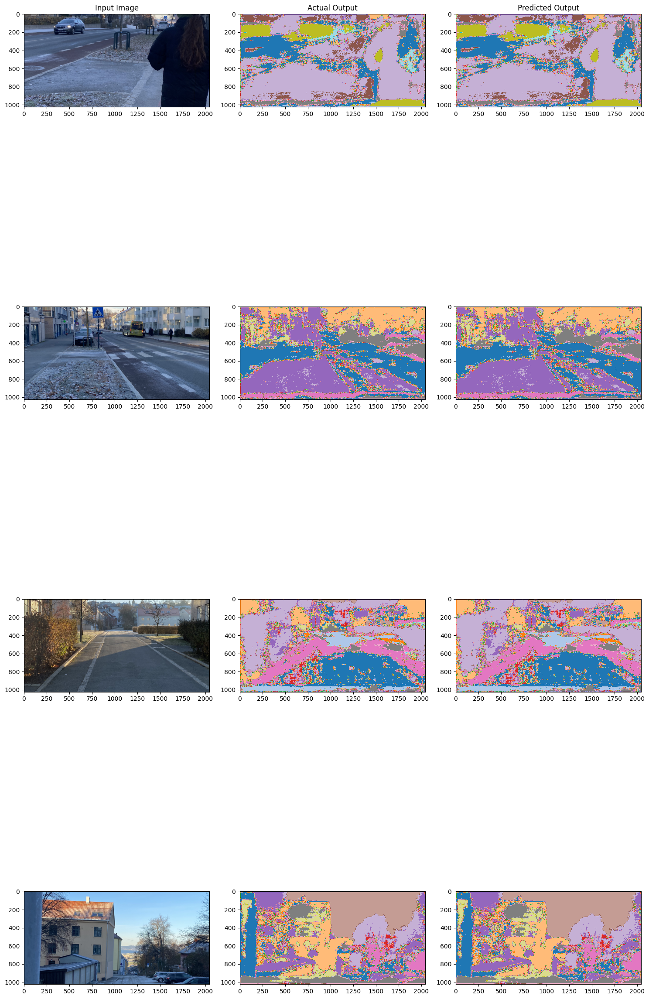

In [70]:
# Ensure the model is in evaluation mode
model.eval()

# Disable gradient computation
with torch.no_grad():
    inputs = torch.stack(images).cuda()  
    print(inputs.size())
    outputs = model(inputs)
    print(outputs.size())
    _, predicted = torch.max(outputs.data, 1)
    show(inputs, predicted.unsqueeze(1), predicted.unsqueeze(1))

In [66]:
print(inputs.size())
print(predicted.size())

torch.Size([4, 3, 1024, 2048])
torch.Size([4, 1024, 2048])


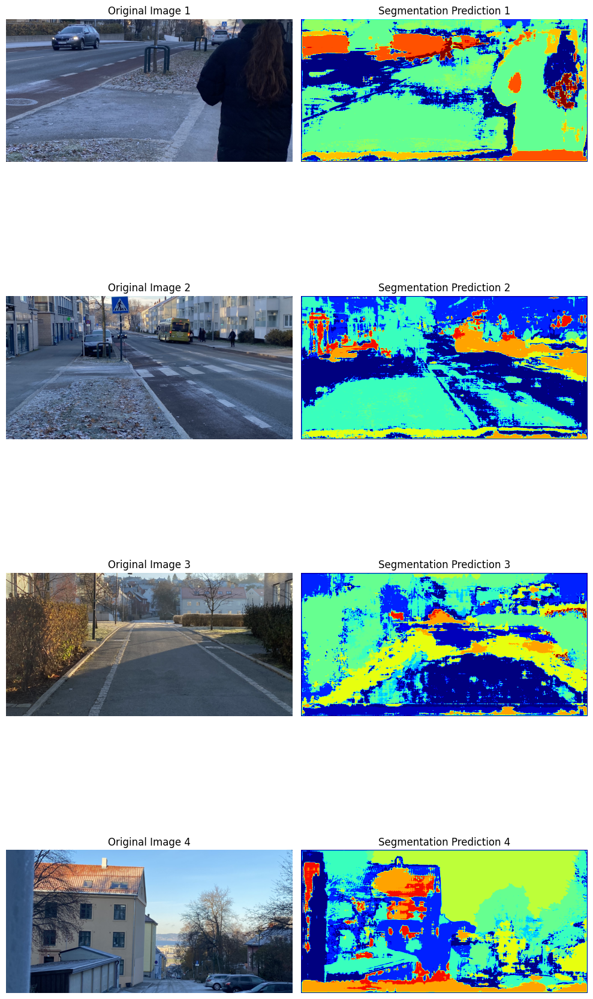

In [67]:
import matplotlib.pyplot as plt

# Number of images
num_images = len(images)

# Set up the matplotlib figure and axes
fig, axs = plt.subplots(num_images, 2, figsize=(10, 5 * num_images))

for i in range(num_images):
    # Display original image
    axs[i, 0].imshow(images[i].cpu().numpy().transpose(1, 2, 0))  # Adjust as necessary
    axs[i, 0].set_title(f'Original Image {i+1}')
    axs[i, 0].axis('off')

    # Display predicted segmentation
    axs[i, 1].imshow(predicted[i].cpu().numpy(), cmap='jet')  # You can choose a different colormap if you like
    axs[i, 1].set_title(f'Segmentation Prediction {i+1}')
    axs[i, 1].axis('off')

plt.tight_layout()
plt.show()
